# Clustercenter-based exploration plots

-----------

Assigning all workflow data to 'master' TICA and clustering models from long trajectory to assess ground-truth exploration of the protein conformation space

Clusters visited by 
 - rows: workload
 - cols: replicate

Plotting from workflow: umi_Ca_3
 - on to workload 0
 - on to workload 1
 - on to workload 2
 - on to workload 3
 - on to workload 4
Plotting from workflow: xma_Ca_3
 - on to workload 0
 - on to workload 1
 - on to workload 2
 - on to workload 3
 - on to workload 4


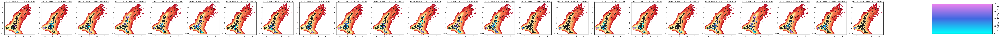

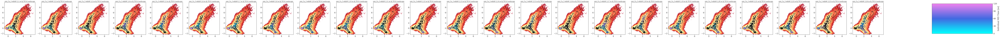

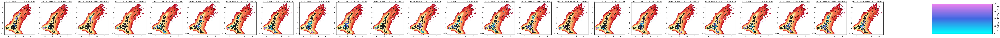

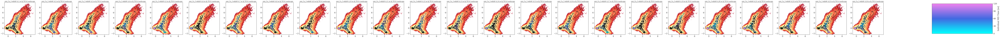

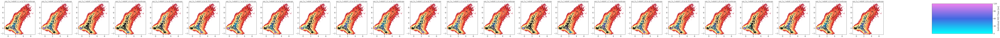

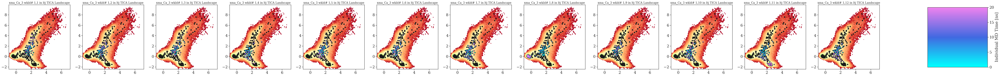

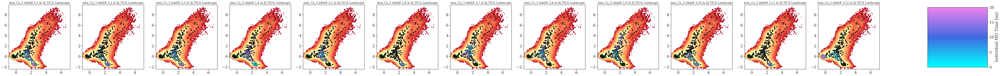

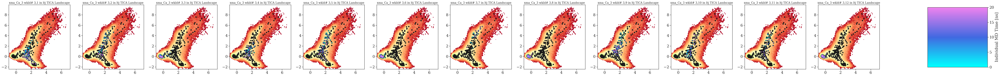

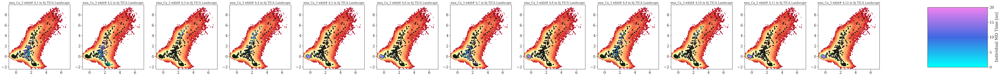

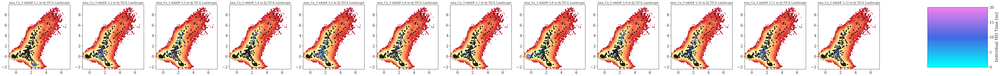

In [66]:
for feat,nm in [("invca","umi_Ca_3"),("invca","xma_Ca_3")]:

    w = all_models[feat][nm]
    ntj = w["n_trajs"]
    
    feature_data = w["data_reader"].get_output()
    
    master_tica  = dict(
   #     wkf = aswa_tools.get_matching_input(
    #        all_models[feat][nm]["tica"],
     #       key="lag", val=chosen_tica_lag),
        ltj = aswa_tools.get_matching_input(
  #  master_tica = aswa_tools.get_matching_input(
            all_models[feat]["ltj"]["tica"],
            key="lag", val=chosen_tica_lag),
    )

    workflow_in_master_tica = {
 #       k: [u[:,:n_tica_dim] for u in v.transform(feature_data)]
        k: v.transform(feature_data)
        for k,v in master_tica.items()
    }
    
    master_cl = dict(
   #     wkf = aswa_tools.get_matching_input(
    #        all_models[feat][nm]["tica"],
     #       key="lag", val=chosen_tica_lag),
        ltj = aswa_tools.get_matching_input(
  #  master_tica = aswa_tools.get_matching_input(
            all_models[feat]["ltj"]["cluster_kmeans"],
            key="k", val=300),
    )
    master_tica  = dict(
   #     wkf = aswa_tools.get_matching_input(
    #        all_models[feat][nm]["tica"],
     #       key="lag", val=chosen_tica_lag),
        ltj = aswa_tools.get_matching_input(
  #  master_tica = aswa_tools.get_matching_input(
            all_models[feat]["ltj"]["tica"],
            key="lag", val=chosen_tica_lag),
    )
    workflow_in_master_cl = {
        k: getattr(v,"assign")(
            [u[:,:n_tica_dim] for u in workflow_in_master_tica[k]])
        for k,v in master_cl.items()
    }
    
    n_workloads = list({
        k : int(len(v)/ntj)
        for k,v in workflow_in_master_cl.items()
    }.values())[0]

    master_in_master_tica = {
        k: np.concatenate(v.get_output([0,1]))
        for k,v in master_tica.items()
    }
    
    print(colorama.Back.BLUE + "Plotting from workflow: %s"%nm)
    
    for iw in range(n_workloads):

        I = len(workflow_in_master_cl)
        fig, ax = plt.subplots(
            I, ntj,
            figsize=(7*ntj, 6*I),
            squeeze=False)
    
        print(colorama.Back.CYAN + " - on to workload %d"%iw)
        
        for i,(wnm,wim) in enumerate(workflow_in_master_cl.items()):
            
            workload_in_workflow = wim[iw*ntj:(1+iw)*ntj]
            
            for j in range(ntj):    
                #pyemma.plots.plot_density(
                pyemma.plots.plot_free_energy(
                    *master_in_master_tica[wnm].T,
                    ax=ax[i][j],
                    alpha=0.8,
                    cbar=False,
                    cmap='RdYlGn_r',
                )
                
                #print(colorama.Back.CYAN + "Visit check from this:")
                #print(
    #colorama.Back.RESET + colorama.Fore.BLUE + pformat(workload_in_workflow[j]))
                
                visited_in_order = list()
                [visited_in_order.append(s)
                 for s in workload_in_workflow[j]
                 if s not in visited_in_order]
                
                #print(len(visited_in_order))
                visited_cc = master_cl[wnm].clustercenters[
                    visited_in_order,:2]

                # TODO color by step number of initial visit
                workload_colors = cmap(
                    plt.Normalize()(list(range(len(
                        visited_in_order)))))
                
                sc1 = ax[i][j].scatter(
                    x=visited_cc[:,0].T,
                    y=visited_cc[:,1].T,
                    c=workload_colors,
                    #linewidth=0,
                    s=10,
                    zorder=10,
                )
                
                sc2 = ax[i][j].scatter(
                    x=master_cl[wnm].clustercenters[:,0].T,
                    y=master_cl[wnm].clustercenters[:,1].T,
                    c='k',
                    #linewidth=0,
                    s=32,
                    zorder=3,
                )
                sc2.set_cmap(cmap)
                ax[i][j].set_title(
                    "%s wkld# %d,%d in %s TICA Landscape"%(
                        nm, 1+iw,1+j,wnm), fontsize=14)
        
        fig.subplots_adjust(right=0.85)
        cbar_ax = fig.add_axes([0.89, 0.15, 0.05, 0.7])
        cb = fig.colorbar(sc2, cax=cbar_ax)
        cb.ax.set_ylabel("Individual MD Time [ns]")
        ticklocs = [r/4. for r in range(4)]+[1]
        cb.set_ticks(ticklocs)
        cb.set_ticklabels([
            int(r*workload_in_workflow[j].shape[0]/step_per_ns[label_longtraj])
            for r in ticklocs])
        
        
        #fig.tight_layout() # doesn't know about extra add_axes call?
        plt.savefig("analyses/%s/wkl-%d-eachguy-cc_on_tica_landscape.png"%(nm,iw), dpi=300)

--------------------
 - Each workload's first visit time in each state

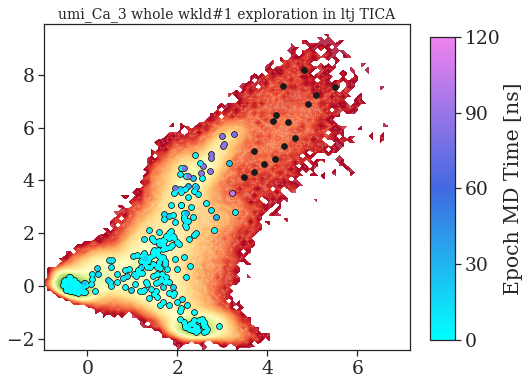

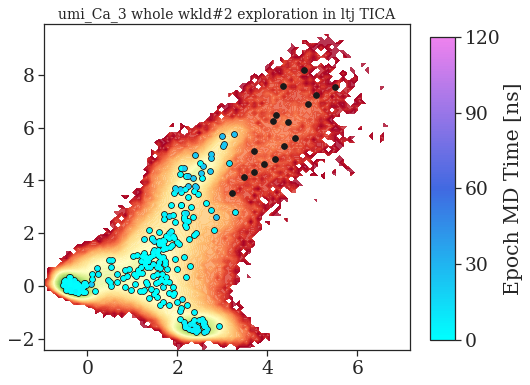

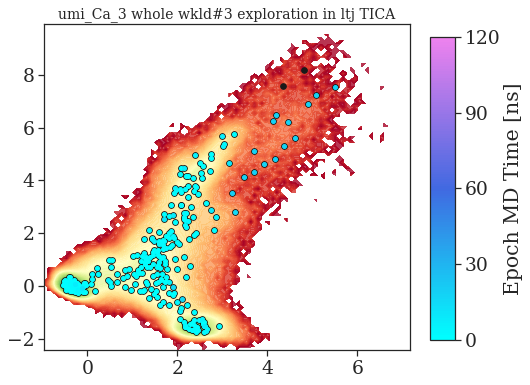

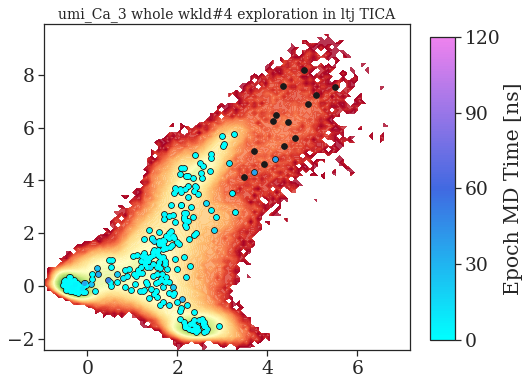

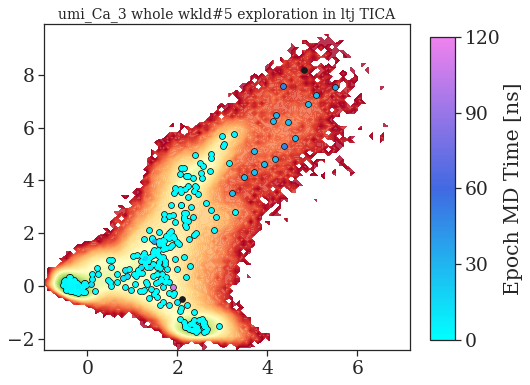

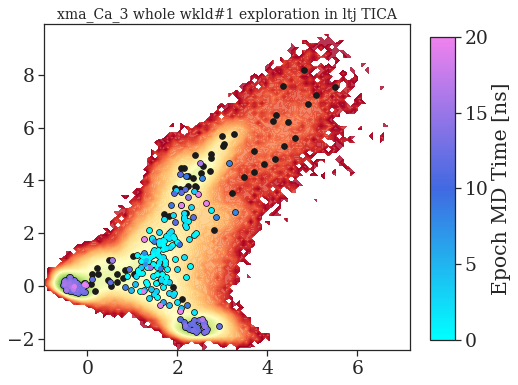

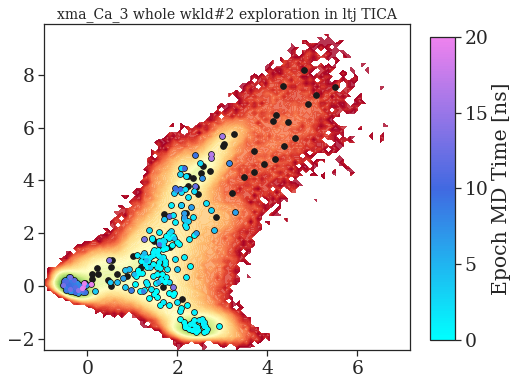

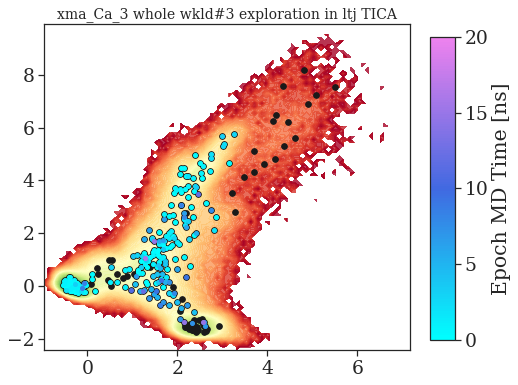

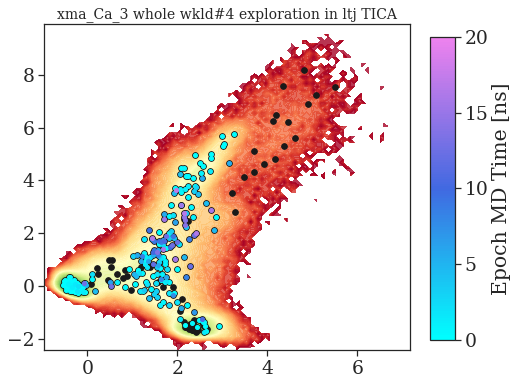

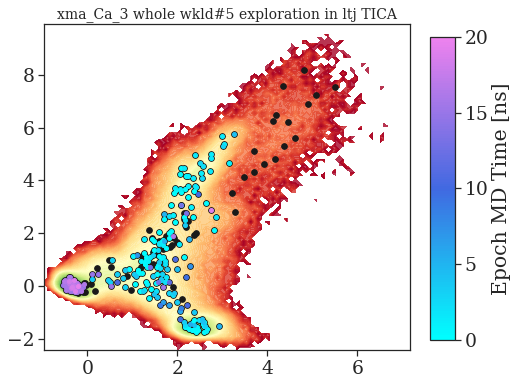

In [67]:
for feat,nm in [("invca","umi_Ca_3"),("invca","xma_Ca_3")]:

    w = all_models[feat][nm]
    ntj = w["n_trajs"]
    
    feature_data = w["data_reader"].get_output()
    
    master_tica  = dict(
   #     wkf = aswa_tools.get_matching_input(
    #        all_models[feat][nm]["tica"],
     #       key="lag", val=chosen_tica_lag),
        ltj = aswa_tools.get_matching_input(
  #  master_tica = aswa_tools.get_matching_input(
            all_models[feat]["ltj"]["tica"],
            key="lag", val=chosen_tica_lag),
    )

    workflow_in_master_tica = {
 #       k: [u[:,:n_tica_dim] for u in v.transform(feature_data)]
        k: v.transform(feature_data)
        for k,v in master_tica.items()
    }
    
    master_cl = dict(
   #     wkf = aswa_tools.get_matching_input(
    #        all_models[feat][nm]["tica"],
     #       key="lag", val=chosen_tica_lag),
        ltj = aswa_tools.get_matching_input(
  #  master_tica = aswa_tools.get_matching_input(
            all_models[feat]["ltj"]["cluster_kmeans"],
            key="k", val=300),
    )
    master_tica  = dict(
   #     wkf = aswa_tools.get_matching_input(
    #        all_models[feat][nm]["tica"],
     #       key="lag", val=chosen_tica_lag),
        ltj = aswa_tools.get_matching_input(
  #  master_tica = aswa_tools.get_matching_input(
            all_models[feat]["ltj"]["tica"],
            key="lag", val=chosen_tica_lag),
    )
    workflow_in_master_cl = {
        k: getattr(v,"assign")(
            [u[:,:n_tica_dim] for u in workflow_in_master_tica[k]])
        for k,v in master_cl.items()
    }
    
    n_workloads = list({
        k : int(len(v)/ntj)
        for k,v in workflow_in_master_cl.items()
    }.values())[0]

    master_in_master_tica = {
        k: np.concatenate(v.get_output([0,1]))
        for k,v in master_tica.items()
    }
    
    for iw in range(n_workloads):

        j = 0
        I = len(workflow_in_master_cl)
        fig, ax = plt.subplots(
            I, 1,
            figsize=(7, 6*I),
            squeeze=False)
    
        for i,(wnm,wim) in enumerate(workflow_in_master_cl.items()):
            
            workload_in_workflow = np.vstack(
                wim[iw*ntj:(1+iw)*ntj])
            
            pyemma.plots.plot_free_energy(
                *master_in_master_tica[wnm].T,
                ax=ax[i][j],
                alpha=0.8,
                cbar=False,
                cmap='RdYlGn_r',
            )
                
            visited_in_order = list()
            
            for epoch in workload_in_workflow.T:
                visited_in_order.append(list())
                for s in epoch:
                    if all([s not in vo for vo in visited_in_order]):
                        visited_in_order[-1].append(s)
           
            visited_cc = [master_cl[wnm].clustercenters[
                vo,:2] for vo in visited_in_order]
            
            # TODO color by step number of initial visit
            workload_colors = cmap(
                plt.Normalize()(list(range(len(
                    visited_in_order)))))
                
            for wc, vcc in zip(workload_colors, visited_cc):
                sc1 = ax[i][j].scatter(
                    x=vcc[:,0].T,
                    y=vcc[:,1].T,
                    #c='skyblue',
                    c=wc[np.newaxis,...],
                    #linewidth=0,
                    s=16,
                    zorder=10,
                )
                
            sc2 = ax[i][j].scatter(
                x=master_cl[wnm].clustercenters[:,0].T,
                y=master_cl[wnm].clustercenters[:,1].T,
                c='k',
                #linewidth=0,
                s=32,
                zorder=3,
            )
            sc1.set_cmap(cmap)
            ax[i][j].set_title(
                "%s whole wkld#%d exploration in %s TICA"%(
                    nm,1+iw,wnm), fontsize=14)
        
        fig.subplots_adjust(right=0.85)
        cbar_ax = fig.add_axes([0.89, 0.15, 0.05, 0.7])
        cb = fig.colorbar(sc1, cax=cbar_ax)
        cb.ax.set_ylabel("Epoch MD Time [ns]")
        ticklocs = [r/4. for r in range(4)]+[1]
        cb.set_ticks(ticklocs)
        cb.set_ticklabels([
            int(r*workload_in_workflow.shape[1]/step_per_ns[label_longtraj])
            for r in ticklocs])
        
        #fig.tight_layout() # doesn't know about extra add_axes call?
        plt.savefig((
            "analyses/%s/wkl-%d-"
            "eachguy-cc_on_tica_landscape.png"%(nm,iw),
            dpi=300))

-----------

 - Tracking first workload visiting each state as rounds go on
 - TODO make it round instead of md time

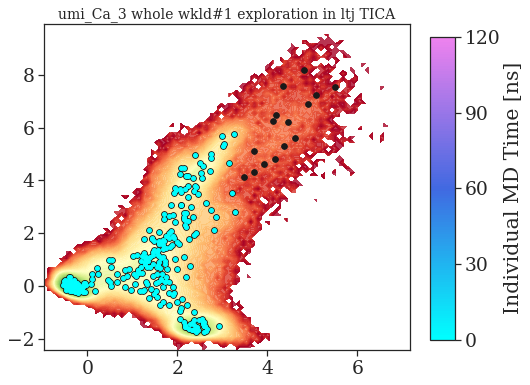

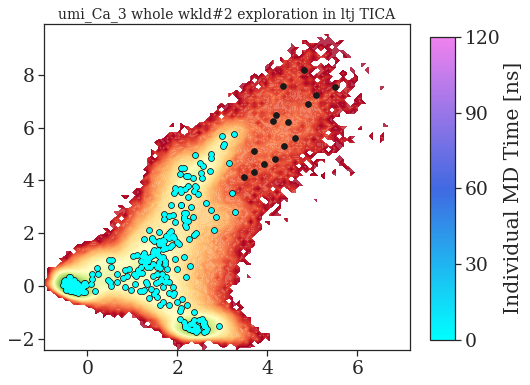

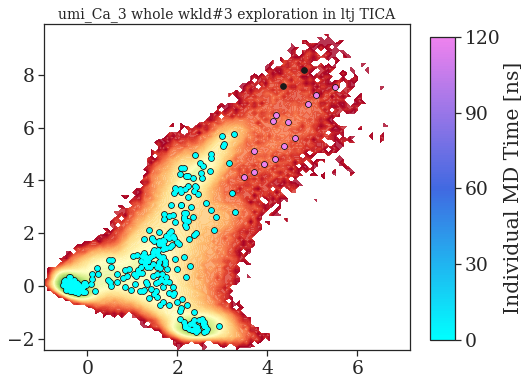

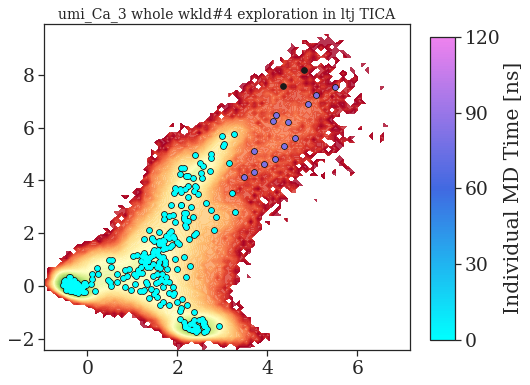

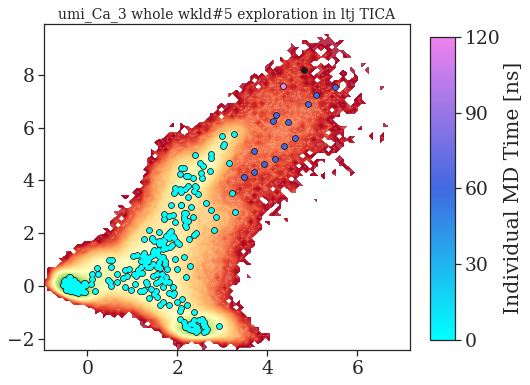

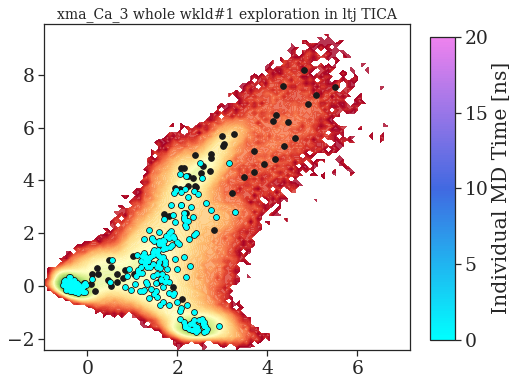

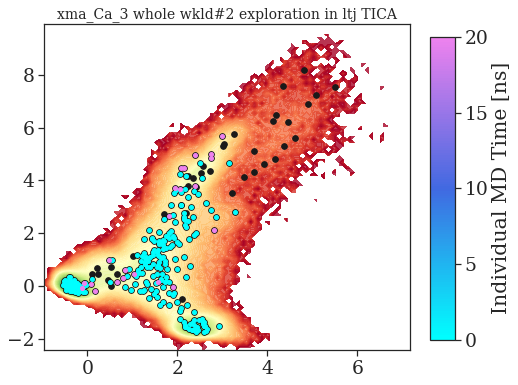

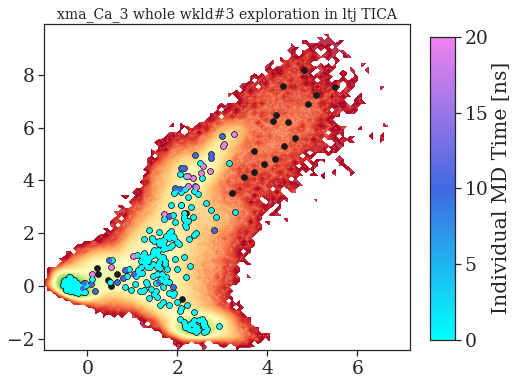

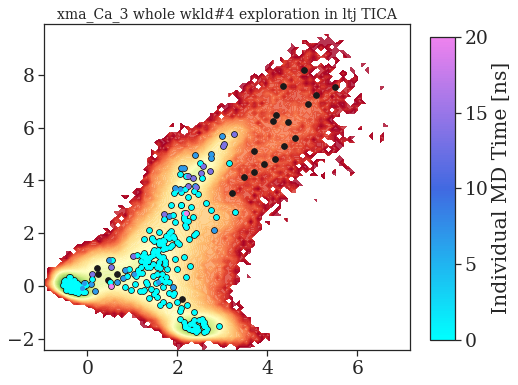

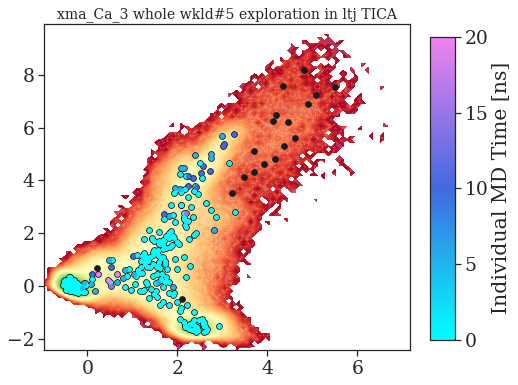

In [68]:
for feat,nm in [("invca","umi_Ca_3"),("invca","xma_Ca_3")]:

    w = all_models[feat][nm]
    ntj = w["n_trajs"]
    
    feature_data = w["data_reader"].get_output()
    
    master_tica  = dict(
        ltj = aswa_tools.get_matching_input(
            all_models[feat]["ltj"]["tica"],
            key="lag", val=chosen_tica_lag),
    )

    workflow_in_master_tica = {
        k: v.transform(feature_data)
        for k,v in master_tica.items()
    }
    
    master_cl = dict(
        ltj = aswa_tools.get_matching_input(
            all_models[feat]["ltj"]["cluster_kmeans"],
            key="k", val=300),
    )
    master_tica  = dict(
        ltj = aswa_tools.get_matching_input(
            all_models[feat]["ltj"]["tica"],
            key="lag", val=chosen_tica_lag),
    )
    workflow_in_master_cl = {
        k: getattr(v,"assign")(
            [u[:,:n_tica_dim] for u in workflow_in_master_tica[k]])
        for k,v in master_cl.items()
    }
    
    n_workloads = list({
        k : int(len(v)/ntj)
        for k,v in workflow_in_master_cl.items()
    }.values())[0]

    master_in_master_tica = {
        k: np.concatenate(v.get_output([0,1]))
        for k,v in master_tica.items()
    }
    
    for i,(wnm,wim) in enumerate(workflow_in_master_cl.items()):
        
        j = 0
        I = len(workflow_in_master_cl)
        visited_in_order = list()
            
        for iw in range(n_workloads):
    
            fig, ax = plt.subplots(
                I, 1,
                figsize=(7, 6*I),
                squeeze=False)
        
            visited_in_order.append(list())
            
            workload_in_workflow = np.vstack(
                wim[iw*ntj:(1+iw)*ntj])
            
            pyemma.plots.plot_free_energy(
                *master_in_master_tica[wnm].T,
                ax=ax[i][j],
                alpha=0.8,
                cbar=False,
                cmap='RdYlGn_r',
            )
                
            for replicate in workload_in_workflow:
                for s in replicate:
                    if all([s not in vo for vo in visited_in_order]):
                        visited_in_order[-1].append(s)
            
            # Builds all up to this workload
            visited_cc = [master_cl[wnm].clustercenters[
                vo,:2] for vo in visited_in_order]
            
            # TODO color by step number of initial visit
            workload_colors = cmap(
                plt.Normalize()(list(range(len(
                    visited_in_order)))))
                
            for k,(wc, vcc) in enumerate(zip(workload_colors, visited_cc)):
                sc1 = ax[i][j].scatter(
                    x=vcc[:,0].T,
                    y=vcc[:,1].T,
                    #c='skyblue',
                    c=wc[np.newaxis,...],
                    #linewidth=0,
                    label="R %d"%k,
                    s=16,
                    zorder=10,
                )
                
            sc2 = ax[i][j].scatter(
                x=master_cl[wnm].clustercenters[:,0].T,
                y=master_cl[wnm].clustercenters[:,1].T,
                c='k',
                #linewidth=0,
                s=32,
                zorder=3,
            )
            sc1.set_cmap(cmap)
            ax[i][j].set_title(
                "%s whole wkld#%d exploration in %s TICA"%(
                    nm,1+iw,wnm), fontsize=14)
        
            fig.subplots_adjust(right=0.85)
            cbar_ax = fig.add_axes([0.89, 0.15, 0.05, 0.7])
            cb = fig.colorbar(sc1, cax=cbar_ax)
            cb.ax.set_ylabel("Individual MD Time [ns]")
            ticklocs = [r/4. for r in range(4)]+[1]
            cb.set_ticks(ticklocs)
            cb.set_ticklabels([
                int(r*workload_in_workflow.shape[1]/step_per_ns[label_longtraj])
                for r in ticklocs])
        
            #fig.tight_layout() # doesn't know about extra add_axes call?
            plt.savefig((
                "analyses/%s/wkl-%d-"
                "eachguy-cc_on_tica_landscape.png"%(nm,iw),
                dpi=400))

-----------

-----------

-----------

-----------

-----------

-----------

-----------

-----------

-----------

-----------

-----------

-----------